<a href="https://colab.research.google.com/github/gmarcelo94/sn-AI-ke/blob/main/SnakesCode_Sketch_v3_12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import os
from random import seed
from random import randint
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.datasets.mnist import load_data
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop, SGD

In [3]:
# With GitHub there is no need for Drive mounting
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
!git clone https://github.com/gmarcelo94/sn-AI-ke

fatal: destination path 'sn-AI-ke' already exists and is not an empty directory.


In [3]:
path = "sn-AI-ke/Venomous" # Once cloned the repository is available localy and the path point to the folder of interest

# Set-up Snake Info and Snake Antivenom dataframes:

In [4]:
df_snakes = pd.read_excel (r'sn-AI-ke/Snake info.xlsx', sheet_name='Most Venomous Snakes')
#print(df_snakes.head(6))
print(df_snakes.shape[0])
print(df_snakes.shape[1])

78
7


In [5]:
df_antivenoms = pd.read_excel (r'sn-AI-ke/Snake info.xlsx', sheet_name='Antivenoms WHO database') #https://github.com/gmarcelo94/sn-AI-ke/blob/main/Snake%20info.xlsx?raw=true
print (df_antivenoms.head(6))
print(df_antivenoms.shape[0])
print(df_antivenoms.shape[1])

      Scientific_Name                                Antivenom  \
0  Ophiophagus hannah  Neuro-polyvalent snake antivenom (QSMI)   
1  Ophiophagus hannah              King cobra antivenin (QSMI)   
2  Bungarus caeruleus        Snake Venom Antiserum I.P. (Asia)   
3  Bungarus caeruleus               Snake venom antiserum I.P.   
4  Bungarus caeruleus   Polyvalent Anti Snake Venom Serum I.P.   
5  Bungarus caeruleus        Polyvalent Snake Antivenin (Asia)   

                                   Manufacturer_Name Manufacturer_Country  \
0                  Queen Saovabha Memorial Institute             Thailand   
1                  Queen Saovabha Memorial Institute             Thailand   
2                               VINS Bioproducts Ltd                India   
3              Premium Serums and Vaccines Pvt. Ltd.                India   
4  King Institute of Preventative Medicine and Re...                India   
5                               Biological E Limited                India  

# Data Preprocessing:

In [6]:
batch_size = 36
img_height = 224
img_width = 224

In [7]:
# Here each dataset is created by fetching the data from the directory Venomous, inside the sn-AI-ke reporsitory
# There is no longer need to have the folder locally and unzipped as it can fetch directly from GitHub

ds_train = tf.keras.utils.image_dataset_from_directory(
    path, #'/content/drive/MyDrive/SnakeTeam_SamsungAI/Venomous.zip',
    labels =  'inferred',
    label_mode = "int",    #int ou string
    color_mode = 'rgb',
    batch_size = batch_size,
    image_size = (img_height, img_width),
    shuffle = True,
    seed = 123,
    validation_split = 0.3,
    subset = "training",
)


val_ds= tf.keras.utils.image_dataset_from_directory(
    path, #'/content/drive/MyDrive/SnakeTeam_SamsungAI/Venomous.zip (Unzipped Files)/Venomous',
    labels =  'inferred',
    label_mode = "int",    #int ou string
    color_mode = 'rgb',
    batch_size = batch_size,
    image_size = (img_height, img_width),
    shuffle = True,
    seed = 123,
    validation_split = 0.3,
    subset = "validation",
)

# Splitting of above val_ds into final validation and test datased (ds_val & ds_test)
l = len(val_ds)
ratio = int(0.3*l)
# print(ratio)
ds_test = val_ds.take(ratio)
ds_val = val_ds.skip(ratio)

Found 1151 files belonging to 6 classes.
Using 806 files for training.
Found 1151 files belonging to 6 classes.
Using 345 files for validation.


In [8]:
print('Batches for training -->', ds_train.cardinality())
print('Batches for testing -->', ds_test.cardinality())
print('Batches for validating -->', ds_val.cardinality())

Batches for training --> tf.Tensor(23, shape=(), dtype=int64)
Batches for testing --> tf.Tensor(3, shape=(), dtype=int64)
Batches for validating --> tf.Tensor(7, shape=(), dtype=int64)


# Exploratory Data Analysis (EDA):

In [9]:
class_names = np.array(ds_train.class_names)
print(class_names)
class_num = class_names.size
print(f'The total number of calsses in the Dataset is of {class_num}')

['Common Krait' 'Indian Cobra' 'King Cobra' 'Monocled Cobra'
 "Russell's Viper" 'Saw-scaled Viper']
The total number of calsses in the Dataset is of 6


In [10]:
ds_explore = ds_train.unbatch()
df = pd.DataFrame(ds_explore.map(lambda x,y: (x,y)))

In [11]:
df.shape

(806, 2)

Check the number of images per existing class:

In [13]:
indexes=[]

for c in range(df.shape[0]):
   indexes.append(int(np.array(df[1][c])))

In [14]:

df2 = pd.DataFrame(indexes)
df_counts = df2[0].value_counts(sort = False, ascending = True)
print(df_counts)

0     89
5    173
2     84
4    177
3     97
1    186
Name: 0, dtype: int64


In [15]:

df_counts[0]

89

In [16]:
class0 = df_counts[0]
class1 = df_counts[1]
class2 = df_counts[2]
class3 = df_counts[3]
class4 = df_counts[4]
class5 = df_counts[5]

d = len(df_counts)
total=0
for u in range(d):
  total = total + df_counts[u]

print(total)

806


Class weigths calculation:

also check:

https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#calculate_class_weights

https://datascience.stackexchange.com/questions/13490/how-to-set-class-weights-for-imbalanced-classes-in-keras

https://www.analyticsvidhya.com/blog/2020/10/improve-class-imbalance-class-weights/

https://towardsdatascience.com/dealing-with-imbalanced-data-in-tensorflow-class-weights-60f876911f99

In [17]:
# Scaling by total/6 helps keep the loss to a similar magnitude.
# The sum of the weights of all examples stays the same.
weight_for_0 = (1 / class0) * (total / d)
weight_for_1 = (1 / class1) * (total / d)
weight_for_2 = (1 / class2) * (total / d)
weight_for_3 = (1 / class3) * (total / d)
weight_for_4 = (1 / class4) * (total / d)
weight_for_5 = (1 / class5) * (total / d)

class_weight = {0: weight_for_0, 1: weight_for_1, 2: weight_for_2, 3: weight_for_3, 4: weight_for_4, 5: weight_for_5}
print(class_weight)

{0: 1.50936329588015, 1: 0.7222222222222223, 2: 1.5992063492063493, 3: 1.3848797250859106, 4: 0.7589453860640302, 5: 0.7764932562620424}


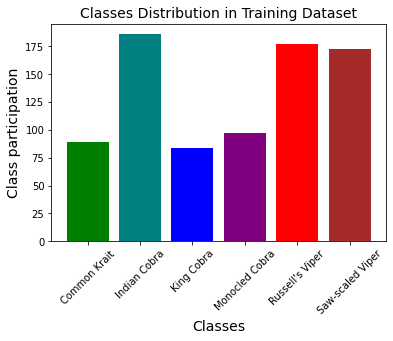

In [18]:
#Can use the class names for x axis
yaxis = []

for k in range(df_counts.shape[0]):
    yaxis.append(df_counts[k])

New_Colors = ['green', 'teal', 'blue','purple','red','brown']
plt.bar(class_names, yaxis, color=New_Colors)
plt.title('Classes Distribution in Training Dataset', fontsize=14)
plt.xlabel('Classes', fontsize=14)
plt.ylabel('Class participation', fontsize=14)
plt.xticks(rotation=45)
plt.show()

In [19]:
normalization_layer = tf.keras.layers.Rescaling(1./255)
ds_train = ds_train.map(lambda x, y: (normalization_layer(x), y)) # Where x—images, y—labels.
ds_val = ds_val.map(lambda x, y: (normalization_layer(x), y)) # Where x—images, y—labels.
ds_test = ds_test.map(lambda x, y: (normalization_layer(x), y)) # Where x—images, y—labels.

In [20]:
AUTOTUNE = tf.data.AUTOTUNE
ds_train = ds_train.cache().prefetch(buffer_size=AUTOTUNE)
ds_val = ds_val.cache().prefetch(buffer_size=AUTOTUNE)
ds_test = ds_test.cache().prefetch(buffer_size=AUTOTUNE)

In [21]:
for image_batch, labels_batch in ds_train:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(36, 224, 224, 3)
(36,)


In [22]:
for image_batch2, labels_batch2 in ds_test:
  print(image_batch2.shape)
  print(labels_batch2.shape)
  break

(36, 224, 224, 3)
(36,)


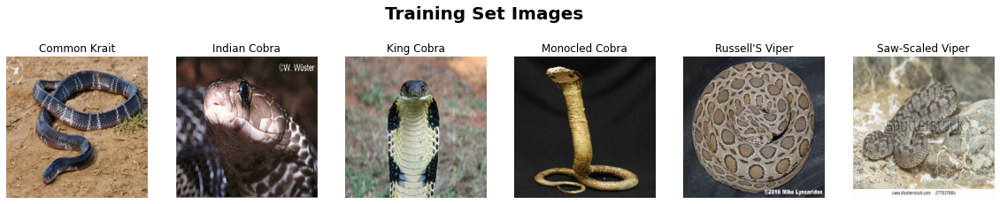

In [23]:
kindex=0
plt.figure(figsize=(20,4))
plt.subplots_adjust(hspace=0.15)

for image, lable in ds_train.unbatch():
  if lable.numpy() == kindex:
    plt.subplot(1,6,kindex+1)
    plt.imshow(image)
    plt.title(class_names[lable.numpy()].title())
    kindex += 1
  else:
      pass
  plt.axis('off')
_ = plt.suptitle("Training Set Images", weight='bold', fontsize = 20)
  # break

# Data Augmentation Selection:

Set and visualize augmentation

In [24]:
RandomContrast = layers.RandomContrast(factor=(0.5, 1.5)) # seed=123
RandomFlip = layers.RandomFlip("horizontal_and_vertical")
RandomRotation = layers.RandomRotation(factor=(0.25), fill_mode='nearest')
RandomZoom = layers.RandomZoom(height_factor=(-0.5, 0.5), width_factor=(-0.5, 0.5))
RandomTranslation = layers.RandomTranslation(0.5, 0.5, fill_mode='reflect', interpolation='bilinear')

In [25]:
def plot_image (image, lable):
  plt.subplot(6,6,kindex+1)
  plt.imshow(image)
  plt.title(class_names[lable.numpy()].title(), fontsize = 20)
  plt.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


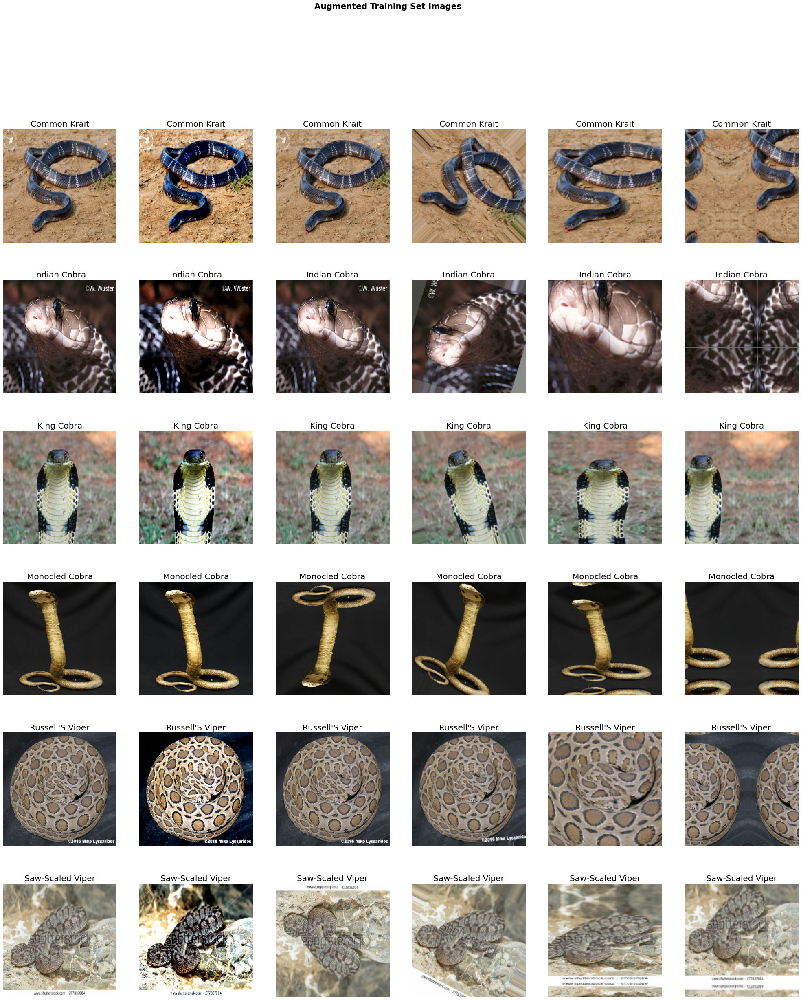

In [31]:
index=0
kindex = 0
plt.figure(figsize=(35,40))
plt.subplots_adjust(hspace=0.15)

for image, lable in ds_train.unbatch():

  if lable.numpy() == index:

    for jindex in range(class_names.size):

      if jindex == 0:
        plot_image(image, lable)
        kindex += 1
      elif jindex == 1:
        image_1 = RandomContrast(image)
        plot_image(image_1, lable)
        kindex += 1
      elif jindex == 2:
        image_2 = RandomFlip(image)
        plot_image(image_2, lable)
        kindex += 1
      elif jindex == 3:
        image_3 = RandomRotation(image)
        plot_image(image_3, lable)
        kindex += 1
      elif jindex == 4:
        image_4 = RandomZoom(image)
        plot_image(image_4, lable)
        kindex += 1
      elif jindex == 5:
        image_5 = RandomTranslation(image)
        plot_image(image_5, lable)
        kindex += 1
        index += 1
 
  else:
      pass

  plt.axis('off')
_ = plt.suptitle("Augmented Training Set Images", weight='bold', fontsize = 20)
  # break

In [ ]:
# ds_1 = ds_train.concatenate(ds_train.map(lambda x, y: (RandomContrast(x), y)))
# ds_2 = ds_train.concatenate(ds_train.map(lambda x, y: (RandomFlip(x), y)))
# ds_3 = ds_train.concatenate(ds_train.map(lambda x, y: (RandomRotation(x), y)))
# ds_4 = ds_train.concatenate(ds_train.map(lambda x, y: (RandomZoom(x), y)))
# ds_5 = ds_train.concatenate(ds_train.map(lambda x, y: (RandomTranslation(x), y)))
# ds_train_aug = ds_train.concatenate(ds_1,ds_2,ds_3,ds_4,ds_5)

# Fetch Feature Vector model:

TensorFlow Hub also distributes models without the top classification layer. These can be used to easily perform transfer learning.

Select a <a href="https://arxiv.org/abs/1801.04381" class="external">MobileNetV2</a> pre-trained model <a href="https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" class="external">from TensorFlow Hub</a>. Any <a href="https://tfhub.dev/s?module-type=image-feature-vector&q=tf2" class="external">compatible image feature vector model</a> from TensorFlow Hub will work here, including the examples from the drop-down menu.

In [32]:
mobilenet_v2 = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" # 224x224
mobilenet_100_v2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_160/feature_vector/5" # 160x160
mobilenet_075_v2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_075_160/feature_vector/5" # 160x160
mobilenet_050_v2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_050_192/feature_vector/5" # 192x192 
mobilenet_035_v2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_035_160/feature_vector/5" # 160x160
mobilenet_100_v3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5" # 224x224
mobilenet_small_100_v3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5" # 224x224
mobilenet_small_075_v3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_075_224/feature_vector/5" # 224x224
mobilenet_large_100_v3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/feature_vector/5" # 224x224
mobilenet_large_075_v3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/feature_vector/5" # 224x224

inception_v2 = "https://tfhub.dev/google/imagenet/inception_v2/feature_vector/5" # 224x224
inception_v3 = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4" # 299x299

restnet_v2 = "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/5" # 224x224

efficientnet_b0 ="https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1" # 224x224
efficientnet_v2 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2" # 240x240
efficientnet_v2_s = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_s/feature_vector/2" # 384x384
efficientnet_v2_m = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_m/feature_vector/2" # 480x480
efficientnet_v2_l ="https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_l/feature_vector/2" # 480x480
efficientnet_v2_b0 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b0/feature_vector/2" # 224x224
efficientnet_v2_ft1k_b0 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b0/feature_vector/2" # 224x224
efficientnet_v2_ftk1_s = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_s/feature_vector/2" # 384x384
efficientnet_v2_ftk1_m = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_m/feature_vector/2" # 480x480
efficientnet_v2_ftk1_l = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_l/feature_vector/2" # 480x480
efficientnet_v2_b1 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b1/feature_vector/2" # 240x240
efficientnet_v2_b2 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b2/feature_vector/2" # 260x260
efficientnet_v2_ftk1_b2 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b2/feature_vector/2" # 260x260
efficientnet_v2_b3 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b3/feature_vector/2" # 300x300
efficientnet_v2_ftk1_b3 = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b3/feature_vector/2" # 300x300

amoebanet_a = "https://tfhub.dev/google/imagenet/amoebanet_a_n18_f448/feature_vector/1" # 331x331

pnasnet_5 = "https://tfhub.dev/google/imagenet/pnasnet_large/feature_vector/5" # 331x331

nasnet_a_large = "https://tfhub.dev/google/imagenet/nasnet_large/feature_vector/5" # 331x331
nasnet_mobile = "https://tfhub.dev/google/imagenet/nasnet_mobile/feature_vector/5" # 224x224


feature_extractor_model = efficientnet_v2_ft1k_b0 #@param ["mobilenet_v2", "inception_v3"] {type:"raw"}

Note: 

Efficientnets are more efficient and have more accuracy.

So far, EfficientNet_V2_b0 trained in ImageNet21K and finetunned in ImageNet1K(efficientnet_v2_tf1k_b0)


# Feature Extractor Layer:

Create the feature extractor by wrapping the pre-trained model as a Keras layer with [`hub.KerasLayer`](https://www.tensorflow.org/hub/api_docs/python/hub/KerasLayer). Use the `trainable=False` argument to freeze the variables, so that the training only modifies the new classifier layer:

In [33]:
feature_extractor_layer = hub.KerasLayer(
    feature_extractor_model,
    input_shape=(img_height, img_width, 3),
    trainable=False)

The feature extractor returns a 1280-long vector for each image (the image batch size remains at 32 in this example):

In [34]:
feature_batch = feature_extractor_layer(image_batch)
print(feature_batch.shape)

(36, 1280)


# Data Augmentation - On-the-fly model:

In [35]:
data_augmentation = tf.keras.Sequential([
  layers.RandomContrast(factor=(0.5, 1.5)), # seed=123
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(factor=(0.25), fill_mode='nearest'), 
  layers.RandomZoom(height_factor=(-0.5, 0.5), width_factor=(-0.5, 0.5)),
  layers.RandomTranslation(0.5, 0.5, fill_mode='reflect', interpolation='bilinear'),
])

# Sn{AI}ke model with attached head, data augmentation and classification layers:

To complete the model, wrap the feature extractor layer in a `tf.keras.Sequential` model and add a fully-connected layer for classification:

In [44]:
num_classes = len(class_names)

model = tf.keras.Sequential([
    data_augmentation,
    feature_extractor_layer,
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(num_classes)
])

# model.summary()

Dropout might bring training and validation closer or even rise validation accuracy above that of training making the model more robust at validation/testing.

In [45]:
predictions = model(image_batch)

In [46]:
predictions.shape

TensorShape([36, 6])

# Model training and Performance visualization:

Use `Model.compile` to configure the training process and add a `tf.keras.callbacks.TensorBoard` callback to create and store logs:

In [47]:
# metrics = [
#       keras.metrics.TruePositives(name='tp'),
#       keras.metrics.FalsePositives(name='fp'),
#       keras.metrics.TrueNegatives(name='tn'),
#       keras.metrics.FalseNegatives(name='fn'), 
#       keras.metrics.Accuracy(name='accuracy'),
#       keras.metrics.Precision(name='precision'),
#       keras.metrics.Recall(name='recall'),
#       keras.metrics.AUC(name='auc'),
#       keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
# ]

In [48]:
model.compile(
  optimizer=tf.keras.optimizers.Adam(), # Adam is the best optimizer in image classification (other optimizers did no perform better)
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc']
)

In [49]:
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1, # Enable histogram computation for every epoch.
    write_images=False) 

Now use the `Model.fit` method to train the model.

To keep this example short, you'll be training for just 10 epochs. To visualize the training progress in TensorBoard later, create and store logs an a [TensorBoard callback](https://www.tensorflow.org/tensorboard/get_started#using_tensorboard_with_keras_modelfit).

Due to the inbalanced number of images per class (imbalanced dataset) consider giving class_weigths:

Check: https://www.tensorflow.org/tutorials/structured_data/imbalanced_data

In [50]:
NUM_EPOCHS = 20

history = model.fit(ds_train_aug,
                    validation_data=ds_val,
                    epochs=NUM_EPOCHS,
                    class_weight=class_weight,
                    callbacks=tensorboard_callback)

Epoch 1/20
23/23 [==============================] - 70s 3s/step - loss: 1.8964 - acc: 0.2630 - val_loss: 1.3849 - val_acc: 0.4515
Epoch 2/20
23/23 [==============================] - 53s 2s/step - loss: 1.3301 - acc: 0.4727 - val_loss: 1.0939 - val_acc: 0.5485
Epoch 3/20
23/23 [==============================] - 52s 2s/step - loss: 1.1933 - acc: 0.5533 - val_loss: 0.9375 - val_acc: 0.6456
Epoch 4/20
23/23 [==============================] - 50s 2s/step - loss: 1.0919 - acc: 0.5744 - val_loss: 0.8533 - val_acc: 0.6793
Epoch 5/20
23/23 [==============================] - 50s 2s/step - loss: 1.0453 - acc: 0.6228 - val_loss: 0.8044 - val_acc: 0.7046
Epoch 6/20
23/23 [==============================] - 52s 2s/step - loss: 1.0285 - acc: 0.6067 - val_loss: 0.7737 - val_acc: 0.7215
Epoch 7/20
23/23 [==============================] - 50s 2s/step - loss: 0.9066 - acc: 0.6576 - val_loss: 0.7730 - val_acc: 0.7089
Epoch 8/20
23/23 [==============================] - 52s 2s/step - loss: 0.9356 - acc: 0.65

Note: 
A train_acc and val_acc close to each other is a sign of a good model (with augmentation it gets better);
Dropout reduces proximity bias and prevents overfitting.

Start the TensorBoard to view how the metrics change with each epoch and to track other scalar values:

In [51]:
%load_ext tensorboard

%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

# Check Predictions:


Confusion Matrix plot fuction:

In [52]:
import seaborn as sns

# Function to create a confusion matrix 
def conf_matrix(y_test, pred_test):    
    
    # Creating a confusion matrix
    con_mat = np.array(tf.math.confusion_matrix(y_test, pred_test))
    con_mat = pd.DataFrame(con_mat, range(6), range(6))
   
    #Ploting the confusion matrix
    plt.figure(figsize=(6,6))
    sns.set(font_scale=1.5) 
    sns.heatmap(con_mat, annot=True, annot_kws={"size": 16}, fmt='g', cmap='Greens', cbar=True, linecolor='black')
    plt.title('Confusion Matrix')
    

Obtain the ordered list of class names from the model predictions:

In [53]:
predicted_batch = model.predict(image_batch) #image_batch
predicted_id = tf.math.argmax(predicted_batch, axis=-1)
predicted_label_batch = class_names[predicted_id]
print(predicted_label_batch)
print(predicted_id)

['King Cobra' 'Common Krait' 'Indian Cobra' 'Indian Cobra' 'King Cobra'
 'Common Krait' 'Saw-scaled Viper' 'Indian Cobra' 'Monocled Cobra'
 'Saw-scaled Viper' 'King Cobra' 'Monocled Cobra' 'Saw-scaled Viper'
 'Indian Cobra' 'Saw-scaled Viper' 'Saw-scaled Viper' 'Saw-scaled Viper'
 'Saw-scaled Viper' 'King Cobra' 'Monocled Cobra' 'Monocled Cobra'
 "Russell's Viper" "Russell's Viper" 'Saw-scaled Viper' 'Indian Cobra'
 'King Cobra' "Russell's Viper" 'Monocled Cobra' 'Common Krait'
 'Saw-scaled Viper' 'Common Krait' 'Saw-scaled Viper' 'Saw-scaled Viper'
 "Russell's Viper" "Russell's Viper" 'Indian Cobra']
tf.Tensor([2 0 1 1 2 0 5 1 3 5 2 3 5 1 5 5 5 5 2 3 3 4 4 5 1 2 4 3 0 5 0 5 5 4 4 1], shape=(36,), dtype=int64)


In [54]:
print(labels_batch)

tf.Tensor([2 0 2 1 2 1 5 1 3 5 2 3 5 3 5 5 4 5 2 3 1 4 4 5 1 2 4 1 0 5 0 5 5 4 4 3], shape=(36,), dtype=int32)


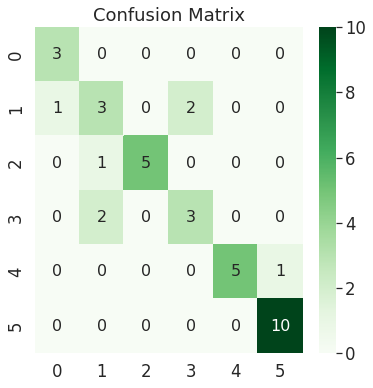

In [55]:
# Plot Conusion Matix: 
conf_matrix(labels_batch, tf.cast(predicted_id, tf.int32))

Plot the model predictions:

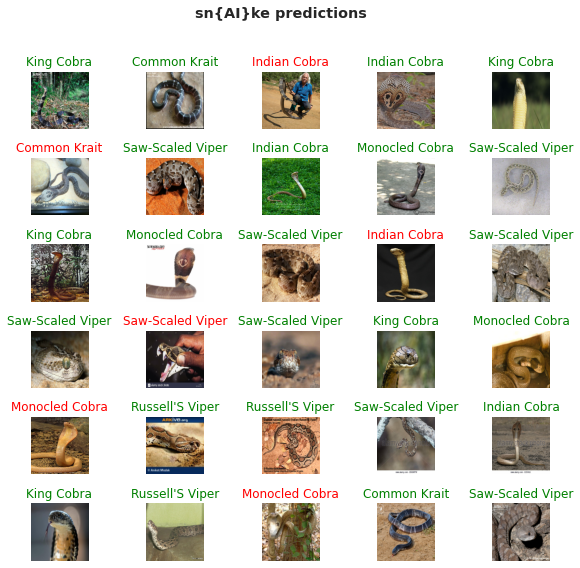

In [56]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)

for n in range(30):
  plt.subplot(6,5,n+1)
  sns.set(font_scale=1.0)
  plt.imshow(image_batch[n])
  if tf.cast(predicted_id[n], tf.int32)==labels_batch[n]:
    plt.title(predicted_label_batch[n].title(), {'color' : 'green'})
  else:
    plt.title(predicted_label_batch[n].title(), {'color' : 'red'})
  plt.axis('off')
_ = plt.suptitle("sn{AI}ke predictions", weight='bold')

# Model Performance on Test Dataset:

Use Test dataset to evaluate the model predictions and accuracy.

In [57]:
predicted_batch2 = model.predict(image_batch2) #image_batch
predicted_id2 = tf.math.argmax(predicted_batch2, axis=-1)
predicted_label_batch2 = class_names[predicted_id2]

print(predicted_label_batch2)
print(tf.cast(predicted_id2, tf.int32))

['Common Krait' 'King Cobra' 'Indian Cobra' "Russell's Viper"
 'Indian Cobra' 'Common Krait' 'Saw-scaled Viper' 'Saw-scaled Viper'
 'Saw-scaled Viper' 'Monocled Cobra' 'Monocled Cobra' 'King Cobra'
 'Indian Cobra' 'Indian Cobra' 'Saw-scaled Viper' 'King Cobra'
 "Russell's Viper" "Russell's Viper" 'King Cobra' 'Common Krait'
 'Common Krait' "Russell's Viper" 'Saw-scaled Viper' 'Saw-scaled Viper'
 'King Cobra' "Russell's Viper" 'Indian Cobra' "Russell's Viper"
 'King Cobra' 'Indian Cobra' 'Monocled Cobra' "Russell's Viper"
 'Indian Cobra' 'Saw-scaled Viper' 'Saw-scaled Viper' 'Monocled Cobra']
tf.Tensor([0 2 1 4 1 0 5 5 5 3 3 2 1 1 5 2 4 4 2 0 0 4 5 5 2 4 1 4 2 1 3 4 1 5 5 3], shape=(36,), dtype=int32)


In [58]:
print(labels_batch2)

tf.Tensor([0 2 1 4 1 0 5 5 5 1 2 1 2 1 5 2 4 4 1 0 0 2 5 5 3 4 1 5 2 1 3 5 1 5 5 3], shape=(36,), dtype=int32)


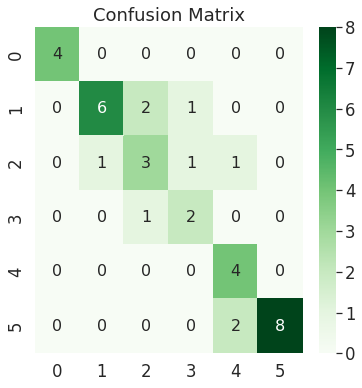

In [59]:
# Plot Conusion Matix: 
conf_matrix(labels_batch2, tf.cast(predicted_id2, tf.int32))

Plot the model predictions:

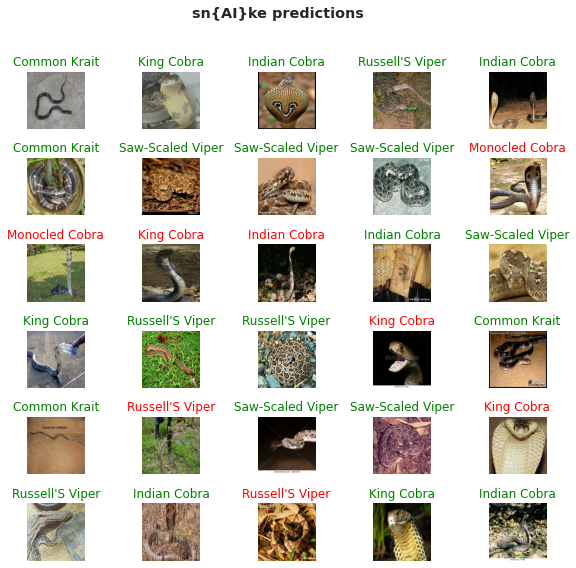

In [60]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)

for n in range(30):
  plt.subplot(6,5,n+1)
  sns.set(font_scale=1.0)
  plt.imshow(image_batch2[n])
  if tf.cast(predicted_id2[n], tf.int32)==labels_batch2[n]:
    plt.title(predicted_label_batch2[n].title(), {'color' : 'green'})
  else:
    plt.title(predicted_label_batch2[n].title(), {'color' : 'red'})
  plt.axis('off')
_ = plt.suptitle("sn{AI}ke predictions", weight='bold')


In [61]:
score = model.evaluate(ds_test, verbose = 0)
print('Test loss:', score[0]) 
print('Test accuracy:', score[1])

Test loss: 0.643216609954834
Test accuracy: 0.7314814925193787


# Single Image Prediction, Model Evaluation & Linked Carachteristics:

(Tested image from the Test Dataset)

In [62]:
# generate some integers
rnum = randint(0, 31)
print(rnum)

6


Plot the model predictions:

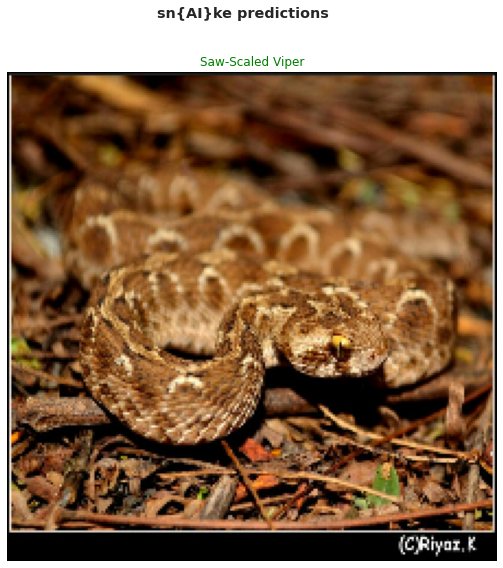

In [63]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)

# plt.subplot(6,5,1+1)
plt.imshow(image_batch2[rnum])
if tf.cast(predicted_id2[rnum], tf.int32)==labels_batch2[rnum]:
  plt.title(predicted_label_batch2[rnum].title(), {'color' : 'green'})
else:
  plt.title(predicted_label_batch2[rnum].title(), {'color' : 'red'})
plt.axis('off')
_ = plt.suptitle("sn{AI}ke predictions", weight='bold')

In [64]:
sci_name=[]
antivenom_info=[]
country_info=[]
k = 0

if tf.cast(predicted_id2[rnum], tf.int32)==labels_batch2[rnum]:
  print(f'Your snake was correctly identified!')
  for i in range(df_snakes.shape[0]):
     if df_snakes.iat[i,0] == predicted_label_batch2[rnum]:
       sci_name=df_snakes.iat[i,1]
       for j in range(df_antivenoms.shape[0]):
        if sci_name == df_antivenoms.iat[j,0]:
          antivenom_info.append(df_antivenoms.iat[j,1])
          country_info.append(df_antivenoms.iat[j,3])
          k += 1

  print(f"Your snake's scientific name is \033[3m {sci_name} \033[0m")
  print(f"And these are the available antivenoms:")
  for l in range(len(antivenom_info)):
    print(f"\t * {antivenom_info[l] : <40} - {country_info[l]: ^10}")

else:
  print(f'Your snake was mistakently identified as {predicted_label_batch2[rnum]}.')
  print(f'WARNING: Cannot give you an accurate Antivenom!')


Your snake was correctly identified!
Your snake's scientific name is  Echis carinatus 
And these are the available antivenoms:
	 * Polyvalent Antisnake Venom Serum         -  Pakistan 
	 * Snake Venom Antiserum (Polyvalent)       -   India   
	 * Polyvalent Snake Antivenin (Asia)        -   India   
	 * Snake antivenin I.P. (Asia)              -   India   
	 * Serum against snake venoms gyurza, efa, cobra polyvalent horse purified concentrated liquid - Uzbekistan
	 * Hexavalent snake venom hexavalent immunoglobulin - Iran (Islamic Republic of)
	 * Pentavalent snake antivenom immunoglobulin - Iran (Islamic Republic of)
	 * Snake Venom Antiserum I.P. (Asia)        -   India   
	 * Polyvalent Anti Snake Venom Serum I.P.   -   India   
	 * Combipack of snake venom antiserum with sterile water for injection (Pan Africa) -   India   
	 * Snake venom antiserum I.P.               -   India   
	 * Inoserp™ MENA                            -   Spain   
	 * SnaFab6                                 

# Outsourced Image: